#### Importing Modules

In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd
import torch
import seaborn as sns
import torch.optim as optim
import torch.nn as nn
import torchvision
import cv2
from sklearn import preprocessing
import matplotlib.gridspec as gridspec
from sklearn.kernel_approximation import RBFSampler
from torcheval.metrics import PeakSignalNoiseRatio, MeanSquaredError
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

#### Code for Matrix factorization

In [2]:
def matrix_factorization(A, k, device=torch.device("cpu")):
    """Factorize the matrix D into A and B"""
    A = A.to(device)
    
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    
    for i in range(1000):
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
     
        optimizer.zero_grad()
        
        loss.backward()
        
        optimizer.step()
        
    return W, H, loss

#### Function for Calculating Errors

In [3]:
def calculate_rmse_psnr(original, reconstructed):    
    if original.device != reconstructed.device:
        reconstructed = reconstructed.to(original.device)
        
    # Ensure the images are float type for calculation
    original = original.float()
    reconstructed = reconstructed.float()
    
    # Flatten the images and compute the squared differences
    diff = (original - reconstructed).pow(2)
    
    # RMSE: Root Mean Square Error
    rmse = torch.sqrt(torch.mean(diff)).item()
    
    # PSNR: Peak Signal-to-Noise Ratio
    max_pixel_value = 255.0  # Assuming 8-bit images
    psnr = 20 * np.log10(max_pixel_value / rmse).item()
    
    return rmse, psnr

#### Reconstructing Image

Using device: cuda:0
--------- Factorizing with k=10 -----------------


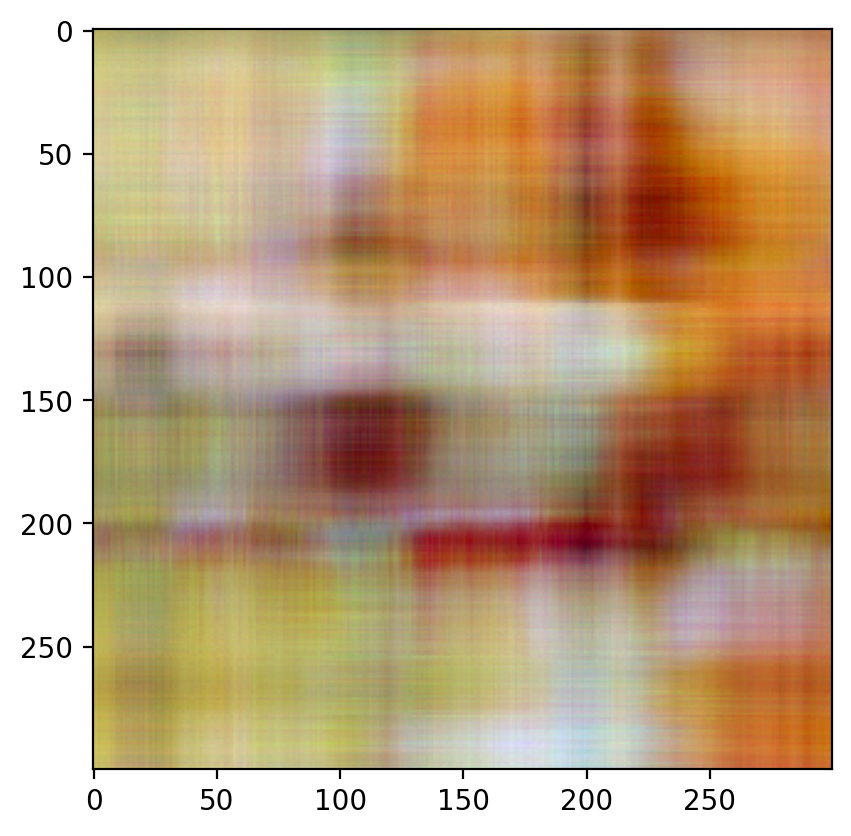

RMSE: 27.82
PSNR: 19.25
--------- Factorizing with k=30 -----------------


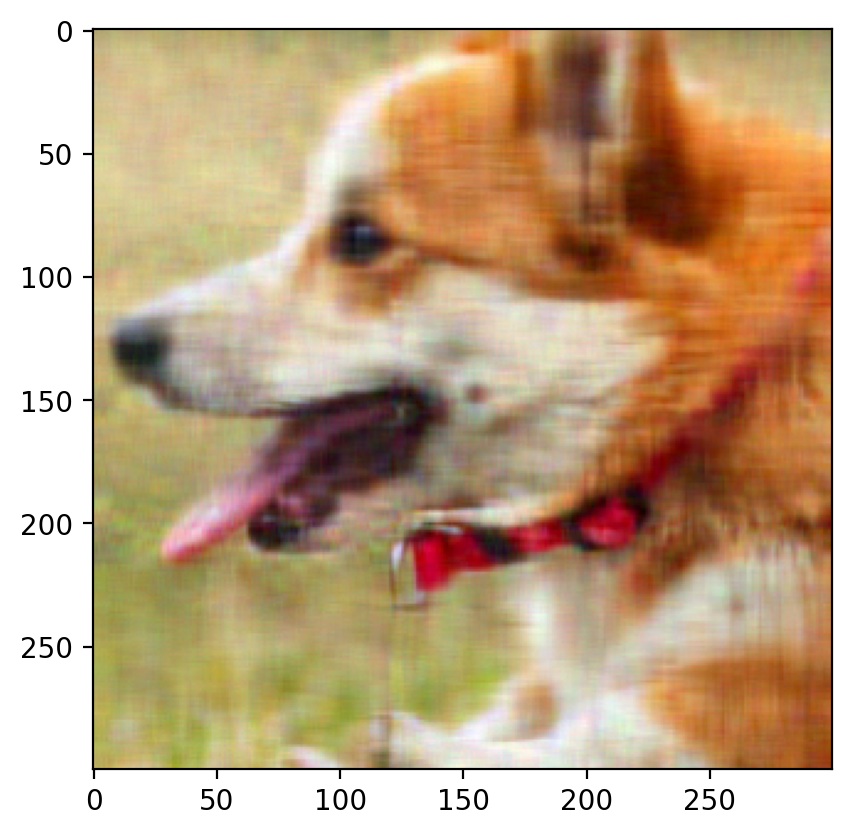

RMSE: 10.58
PSNR: 27.64
--------- Factorizing with k=50 -----------------


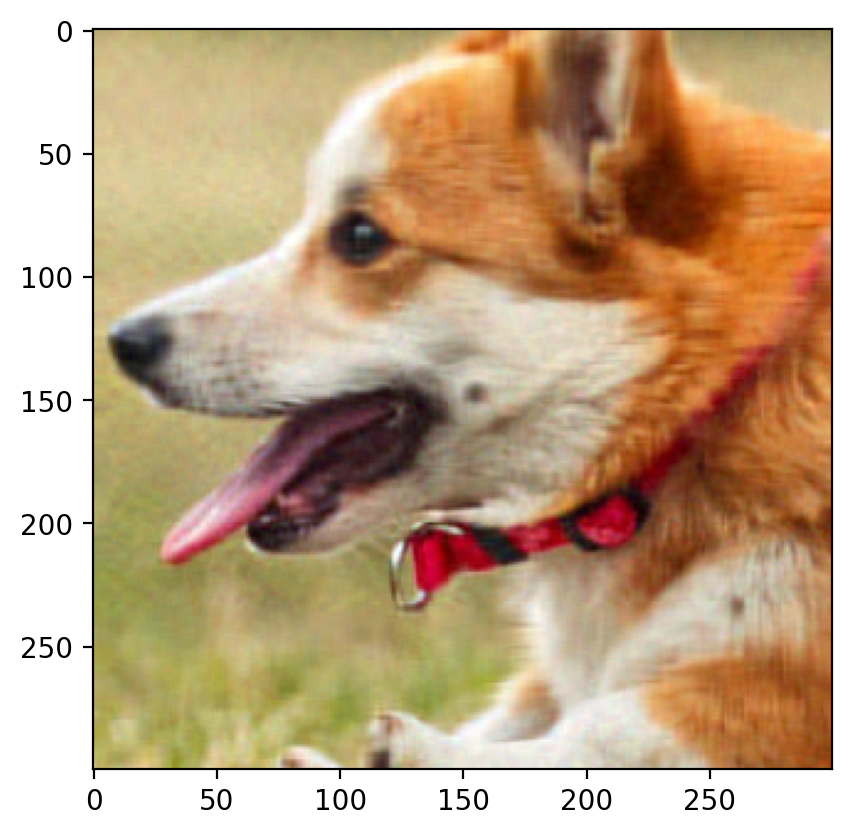

RMSE: 5.88
PSNR: 32.75
--------- Factorizing with k=70 -----------------


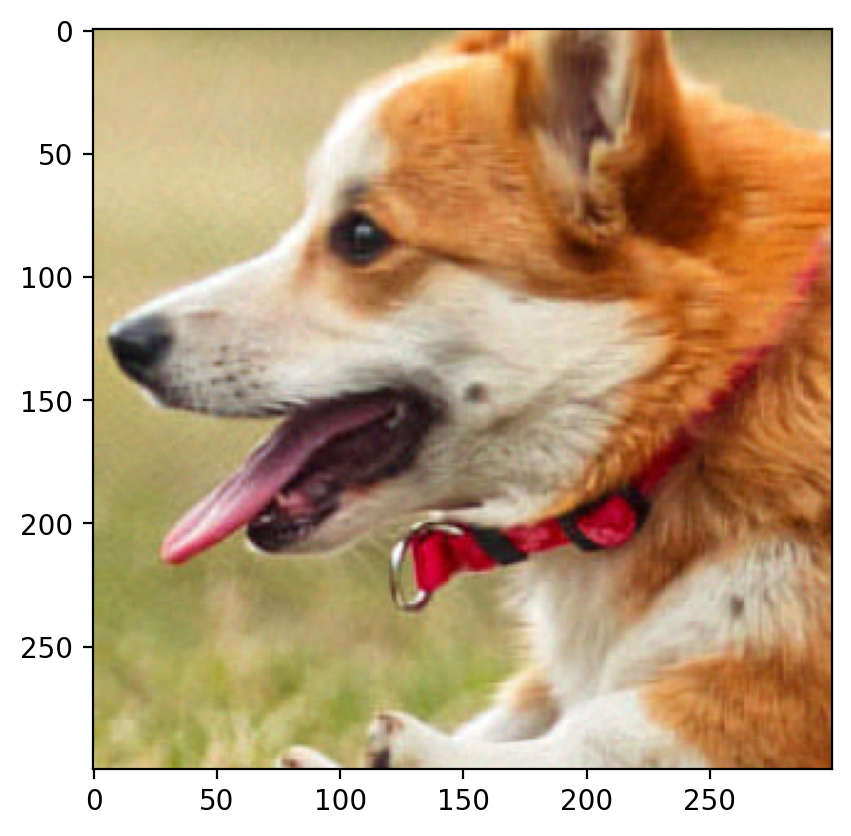

RMSE: 3.72
PSNR: 36.71
--------- Factorizing with k=90 -----------------


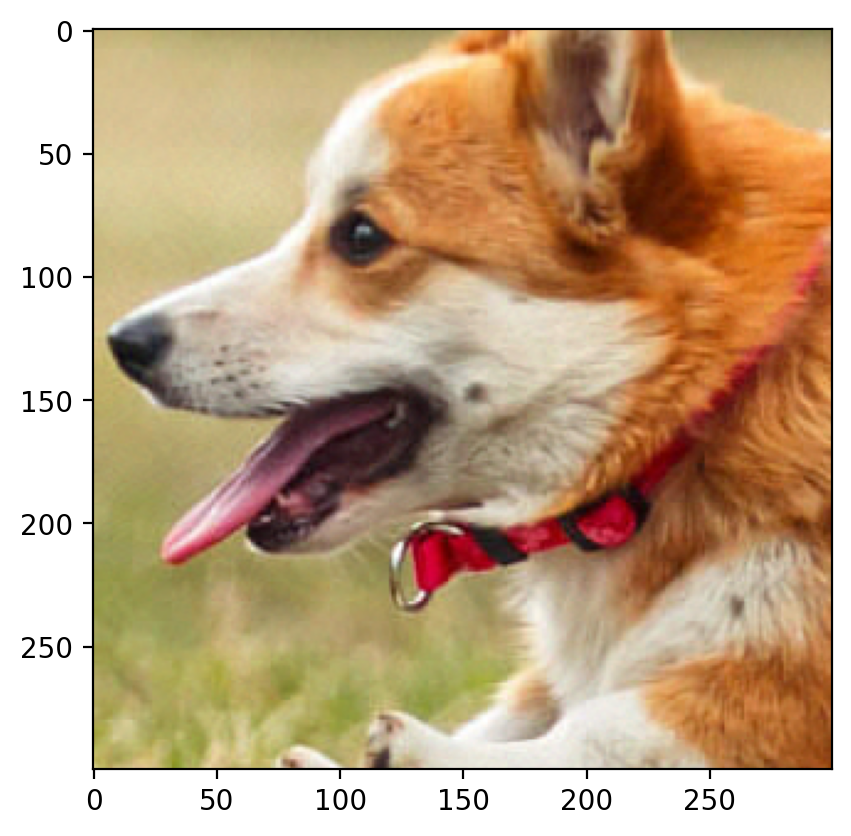

RMSE: 2.44
PSNR: 40.40
--------- Factorizing with k=110 -----------------


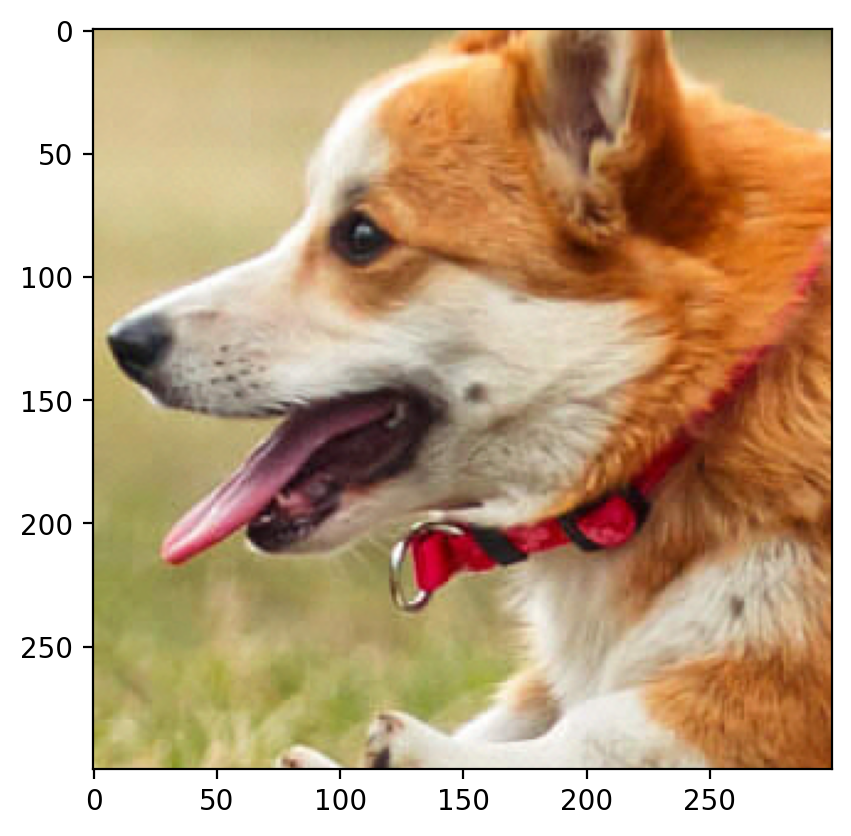

RMSE: 1.60
PSNR: 44.02
--------- Factorizing with k=130 -----------------


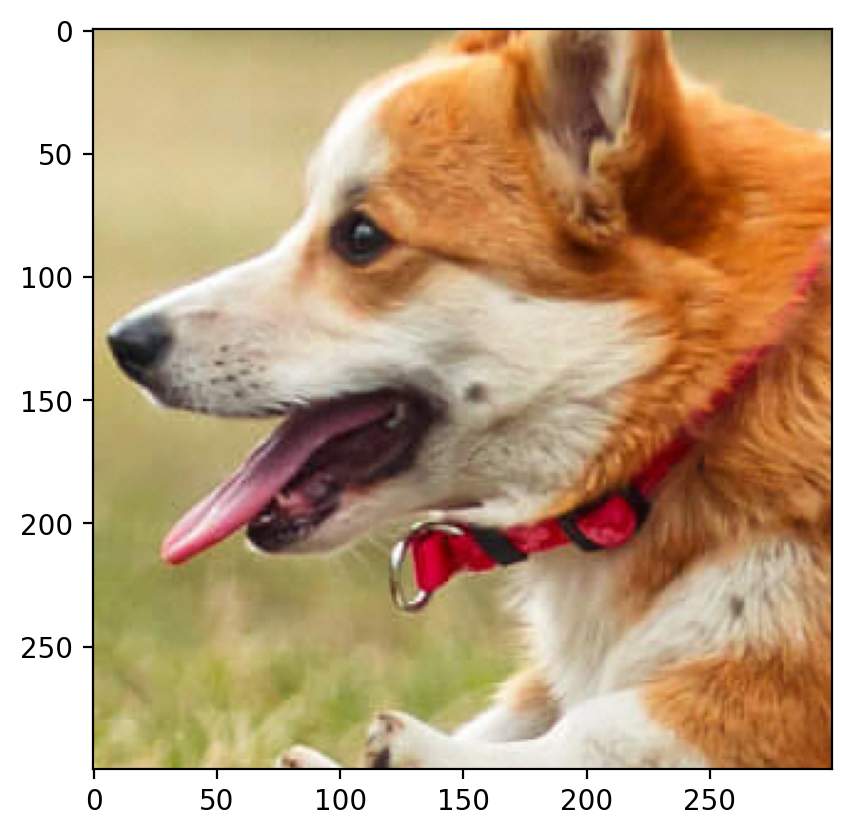

RMSE: 1.08
PSNR: 47.49
--------- Factorizing with k=150 -----------------


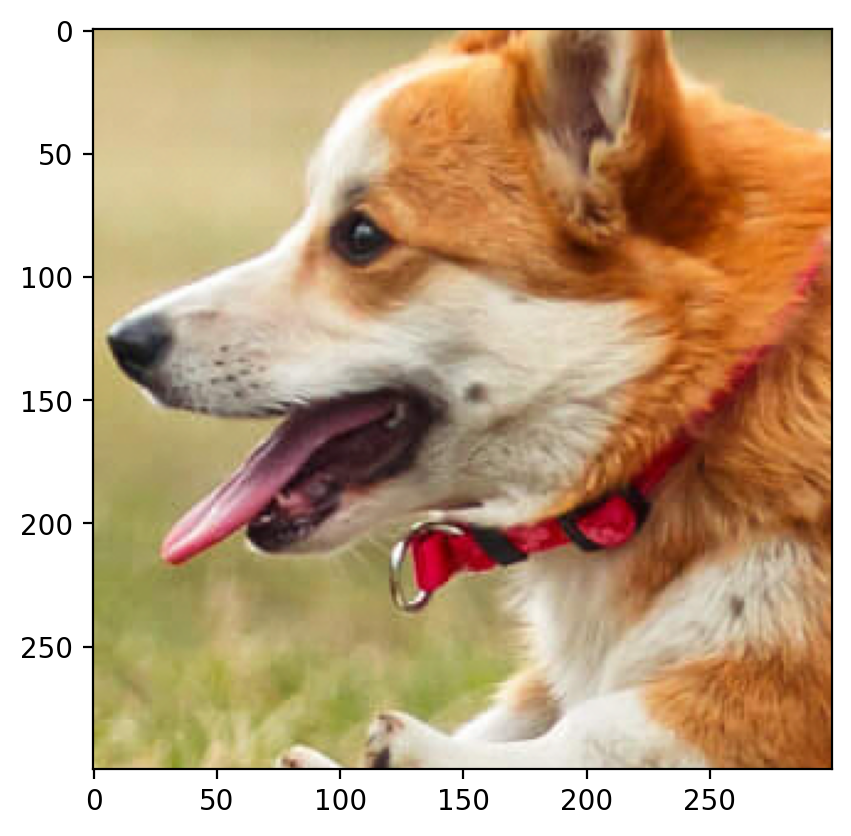

RMSE: 0.74
PSNR: 50.80
--------- Factorizing with k=170 -----------------


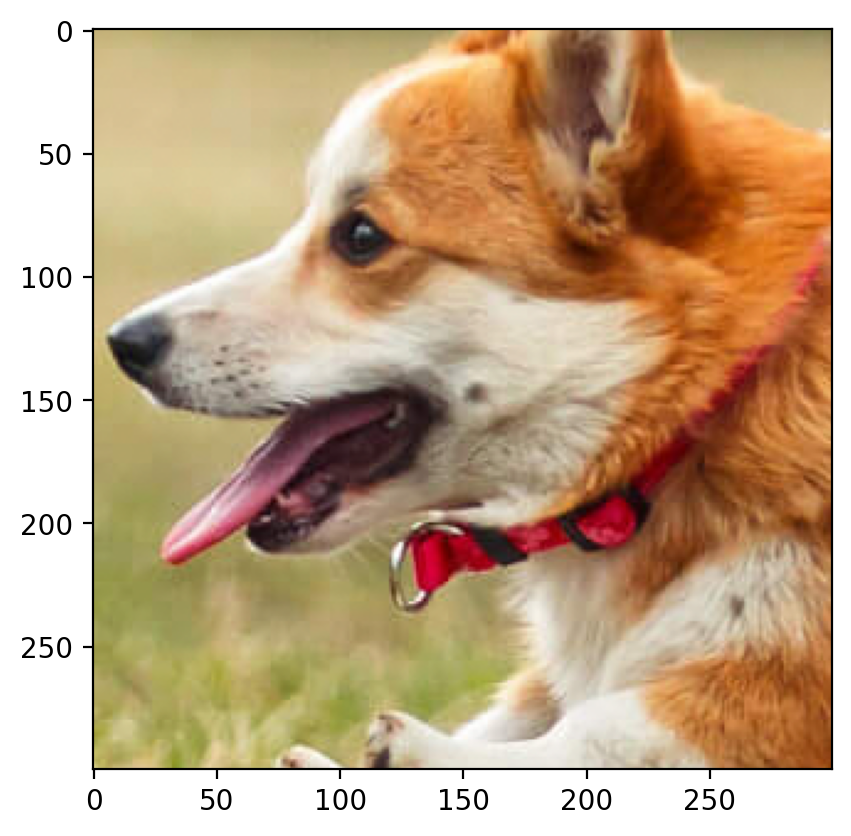

RMSE: 0.55
PSNR: 53.39
--------- Factorizing with k=190 -----------------


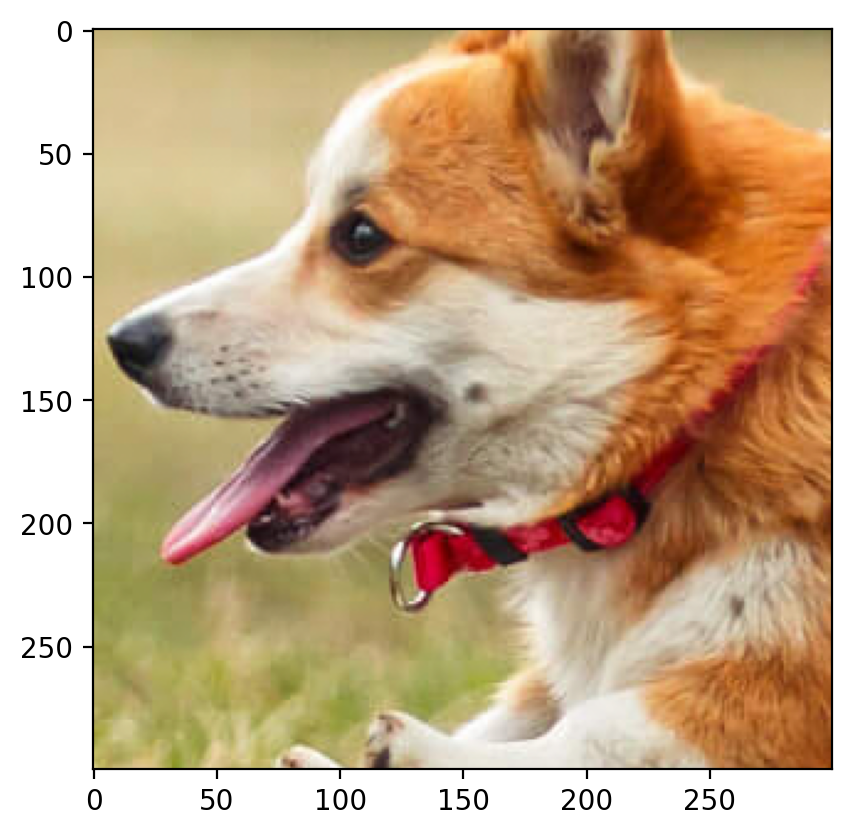

RMSE: 0.44
PSNR: 55.22


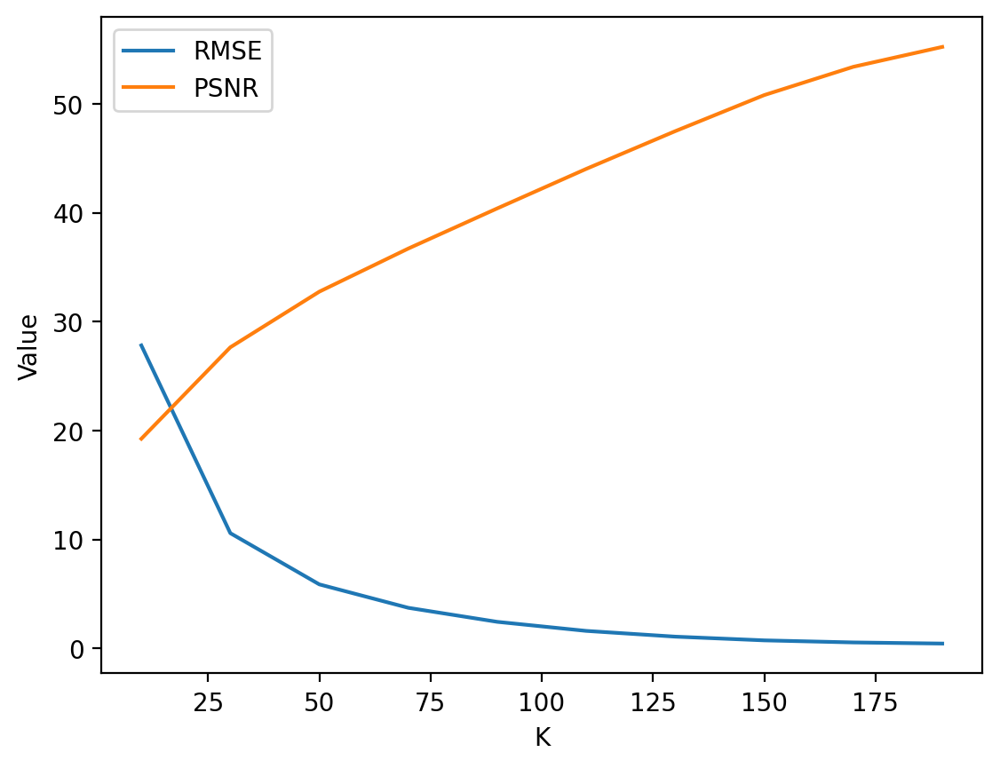

In [4]:
image = torchvision.io.read_image("sample_images/dog.jpg")
image = torchvision.transforms.functional.crop(image, 600, 800, 300, 300)

image = image.clone().detach().float().requires_grad_(True)

redChannel = image[0]
greenChannel = image[1]
blueChannel = image[2]

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

RMSEs = []
PSNRs = []
Ks = []
for k in range(10,201,20):
    Ks.append(k)
    print(f"--------- Factorizing with k={k} -----------------")
    wRed, hRed, lossRed = matrix_factorization(redChannel, k, device=device)
    wGreen, hGreen, lossGreen = matrix_factorization(greenChannel, k, device=device)
    wBlue, hBlue, lossBlue = matrix_factorization(blueChannel, k, device=device)

    redChannelReconstructed = torch.mm(wRed, hRed)
    greenChannelReconstructed = torch.mm(wGreen, hGreen)
    blueChannelReconstructed = torch.mm(wBlue, hBlue)

    reconstructedImage = torch.stack([redChannelReconstructed, greenChannelReconstructed, blueChannelReconstructed], dim=0)
    reconstructedImage = reconstructedImage.clamp(0, 255)

    plt.imshow(reconstructedImage.permute(1, 2, 0).byte().cpu().numpy())
    #plt.axis("off")
    plt.show()

    rmse, psnr = calculate_rmse_psnr(image, reconstructedImage)
    RMSEs.append(rmse)
    PSNRs.append(psnr)
    print(f"RMSE: {rmse:.2f}")
    print(f"PSNR: {psnr:.2f}")

plt.plot(Ks, RMSEs)
plt.plot(Ks, PSNRs)
plt.xlabel("K")
plt.ylabel("Value")
plt.legend(["RMSE", "PSNR"])
plt.show()


#### Reconstructing Matrix with random patch removed

Pixels are being removed in two fashion, once a complete patch is removed and the next time randomly different pixels are removed.

##### Using Non Negative Matrix Factorisation

--------------- Removing a patch from the image -----------------


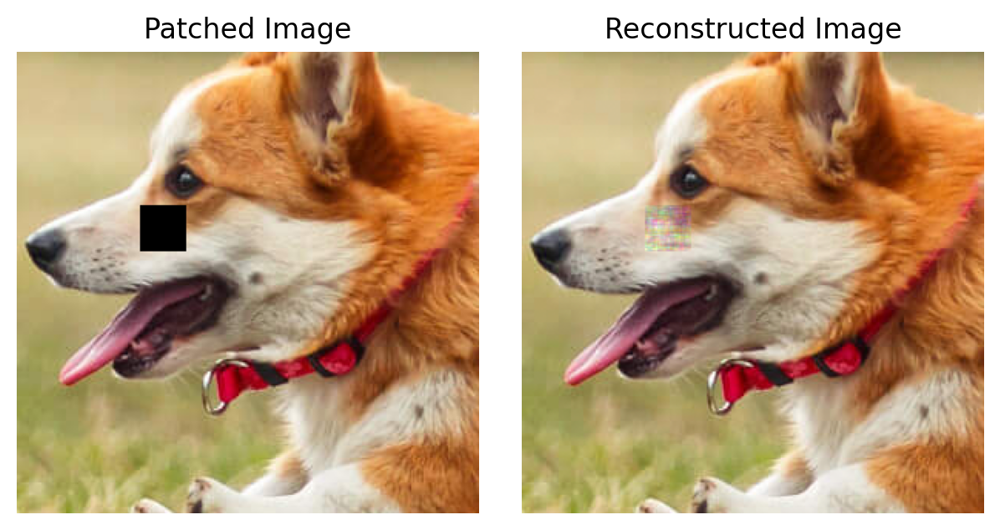

RMSE: 3.06
PSNR: 38.41
--------------- Removing random pixels from the image -----------------


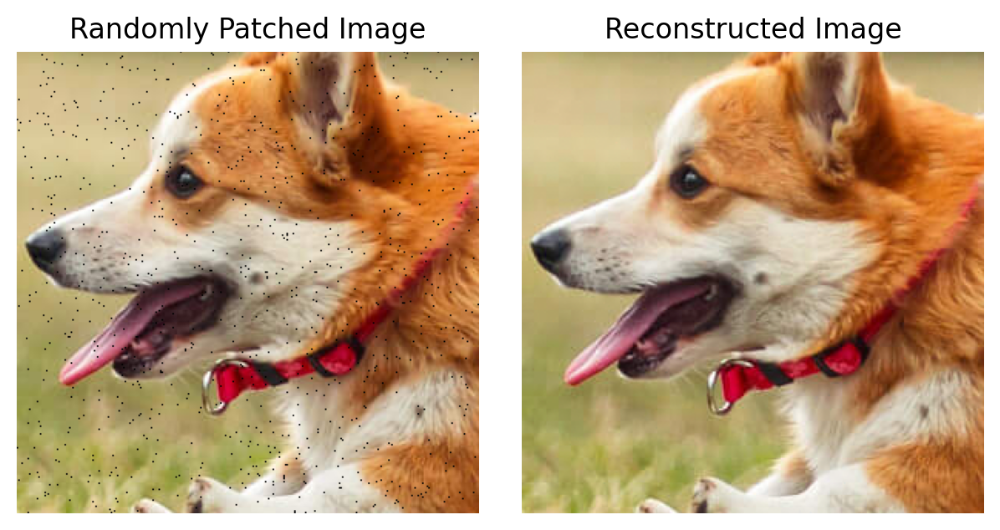

RMSE: 0.53
PSNR: 53.64


In [5]:
patchedImage = image.clone().detach()

patchedImage[:, 100:130, 80:110] = torch.nan

print("--------------- Removing a patch from the image -----------------")

plt.subplot(1, 2, 1)
plt.tight_layout()
plt.imshow(patchedImage.permute(1, 2, 0).byte().numpy())
plt.axis("off")
plt.title("Patched Image")

redChannel = patchedImage[0]
greenChannel = patchedImage[1]
blueChannel = patchedImage[2]

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

wRed, hRed, lossRed = matrix_factorization(redChannel, 200, device=device)
wGreen, hGreen, lossGreen = matrix_factorization(greenChannel, 200, device=device)
wBlue, hBlue, lossBlue = matrix_factorization(blueChannel, 200, device=device)

redChannelReconstructed = torch.mm(wRed, hRed)
greenChannelReconstructed = torch.mm(wGreen, hGreen)
blueChannelReconstructed = torch.mm(wBlue, hBlue)

reconstructedImage = torch.stack([redChannelReconstructed, greenChannelReconstructed, blueChannelReconstructed], dim=0)
reconstructedImage = reconstructedImage.clamp(0, 255)

plt.subplot(1, 2, 2)
plt.imshow(reconstructedImage.permute(1, 2, 0).byte().cpu().numpy())
plt.axis("off")
plt.title("Reconstructed Image")
plt.show()

rmse, psnr = calculate_rmse_psnr(image, reconstructedImage)
print(f"RMSE: {rmse:.2f}")
print(f"PSNR: {psnr:.2f}")


print("--------------- Removing random pixels from the image -----------------")

randomlyPatchedImage = image.clone().detach()
mask = np.random.rand(*randomlyPatchedImage.shape[1:]) < 0.01  # 1% of the image will be masked
randomlyPatchedImage[:, mask] = torch.nan

plt.subplot(1, 2, 1)
plt.tight_layout()
plt.imshow(randomlyPatchedImage.permute(1, 2, 0).byte().numpy())
plt.axis("off")
plt.title("Randomly Patched Image")

redChannel = randomlyPatchedImage[0]
greenChannel = randomlyPatchedImage[1]
blueChannel = randomlyPatchedImage[2]

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

wRed, hRed, lossRed = matrix_factorization(redChannel, 200, device=device)
wGreen, hGreen, lossGreen = matrix_factorization(greenChannel, 200, device=device)
wBlue, hBlue, lossBlue = matrix_factorization(blueChannel, 200, device=device)

redChannelReconstructed = torch.mm(wRed, hRed)
greenChannelReconstructed = torch.mm(wGreen, hGreen)
blueChannelReconstructed = torch.mm(wBlue, hBlue)

reconstructedImage = torch.stack([redChannelReconstructed, greenChannelReconstructed, blueChannelReconstructed], dim=0)
reconstructedImage = reconstructedImage.clamp(0, 255)

plt.subplot(1, 2, 2)
plt.imshow(reconstructedImage.permute(1, 2, 0).byte().cpu().numpy())
plt.axis("off")
plt.title("Reconstructed Image")
plt.show()

rmse, psnr = calculate_rmse_psnr(image, reconstructedImage)
print(f"RMSE: {rmse:.2f}")
print(f"PSNR: {psnr:.2f}")
